In [ ]:
from PIL import Image
import numpy as np
import math
import skimage as ski
import matplotlib.pyplot as plt
from skimage import io,segmentation,filters
import scipy.stats as st
from scipy.ndimage import gaussian_filter
from scipy.signal import convolve2d, medfilt
from astropy.convolution import Gaussian1DKernel, Gaussian2DKernel
import cv2
from IPython.display import Image


url = "~/Documentos/A_Cuarto/VA/P1"

def image_gray(url):
  img = io.imread(url, as_gray=True)
  if(img is not None):
    return np.array(img)


In [ ]:
img_pre = image_gray(url+"/lena.png")

In [ ]:
class Utils:
  def plot_test_compare(original_img, a_img, b_img):
    """
    Parameters
    ----------
    original_img: array
      Imagen original.
    a_img: array
      Imagen resultado del primer algoritmo a comparar
    b_img: array
      Imagen resultado del segundo algoritmo a comparar
    """
    kwargs = dict(histtype='stepfilled', alpha=0.3, bins=40)

    plt.hist(original_img.flat, **kwargs)
    plt.hist(a_img.flat, **kwargs)
    plt.hist(b_img.flat, **kwargs)

    plt.show();

    f, axarr = plt.subplots(ncols=3,figsize=(50,50),sharex=True, sharey=True)
    axarr[0].imshow(original_img, cmap='gray')
    axarr[1].imshow(a_img, cmap='gray')
    axarr[2].imshow(b_img, cmap='gray')

    plt.show();

  def plot_test_compare_n(list_imgs, cols):

    for img in list_imgs:
      plt.hist(img[1].flat, **kwargs)

    plt.show();
    rows = math.floor(len(list_imgs)/cols)
    auxr = rows

    while auxr > 0:
      f, axarr = plt.subplots(ncols=cols,figsize=(40,40),sharex=True, sharey=True,)
      for j in range(0, cols):
        axarr[j].imshow(list_imgs[j+(rows - auxr)*cols][1], cmap='gray')
        axarr[j].title.set_text(list_imgs[j+(rows - auxr)*cols][0])
      auxr-=1
      plt.show();

    lastRowCols = len(list_imgs)-cols*rows;
    
    if lastRowCols!=0 :
      f, axarr = plt.subplots(ncols=lastRowCols,figsize=(50,50),sharex=True, sharey=True)
      for i in range(0, lastRowCols):
        axarr[i].imshow(list_imgs[(cols*rows)+i][1], cmap='gray')
        axarr[i].title.set_text(list_imgs[(cols*rows)+i][0])

      plt.show();

  def get_gauss_2d_kernel(sigma, mu, rX, rY):
    x, y = np.meshgrid(np.linspace(-1,1,rX), np.linspace(-1,1,rY))
    d = np.sqrt(x*x+y*y)
    return np.exp(-( (d-mu)**2 / ( 2.0 * sigma**2 ) ) )

  
  def gkern(kernlen=21, nsig=3):
    """Returns a 2D Gaussian kernel array."""
    interval = (2*nsig+1.)/(kernlen)
    x = np.linspace(-nsig-interval/2., nsig+interval/2., kernlen+1)
    kern1d = np.diff(st.norm.cdf(x))
    kernel_raw = np.sqrt(np.outer(kern1d, kern1d))
    kernel = kernel_raw/kernel_raw.sum()
    return kernel
  
  def highBoost(image, lamb, param, A):
    # Blur the image
    gauss = lamb(image, param)
    # Apply Unsharp masking
    return cv2.addWeighted(image, A, gauss, 1, 0)



outImage = **adjustIntensity** (inImage, inRange=[], outRange=[0 1])
  

*   **inImage**: Matriz MxN con la imagen de entrada
*   **outImage**: Matriz MxN con la imagen de salida.

*   **inRange**: Vector 1x2 con el rango de niveles de intensidad [imin, imax]
de entrada. Si el vector est´a vac´ıo (por defecto), el m´ınimo y m´aximo
de la imagen de entrada se usan como imin e imax
*   **outRange**: Vector 1x2 con el rango de niveles de instensidad [omin, omax]
de salida. El valor por defecto es [0 1].










In [ ]:
def adjustIntensity(image, inRange=[], outRange=[0.0, 1.0]):

  if not inRange :
    inRange = [np.min(image), np.max(image)]

  imin, imax = (inRange[0], inRange[1])
  omin, omax = (outRange[0], outRange[1])

  image = np.clip(image, imin, imax)

  if imin != imax:
      image = (image - imin) / (imax - imin)
      image = image * (omax - omin) + omin
      return np.asarray(image)
  else:
      return np.clip(image, omin, omax)


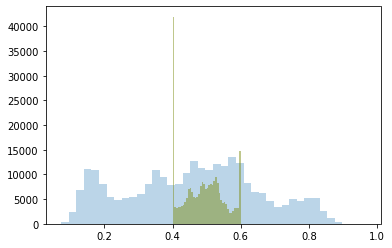

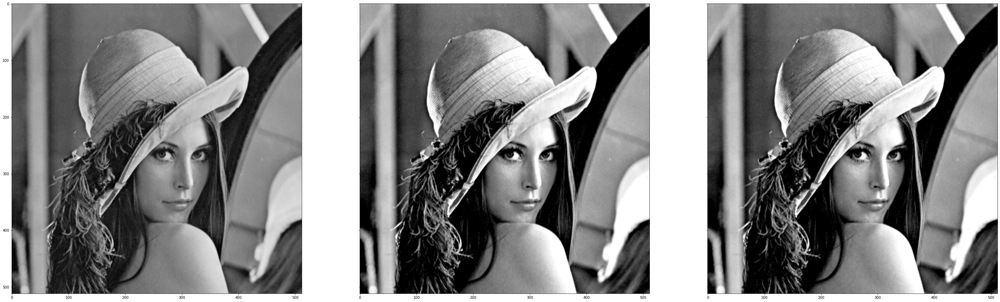

In [ ]:
original = img_pre
my_image = adjustIntensity(img_pre, inRange = [0.2, 0.8], outRange=[0.4,0.6])
alg_image = ski.exposure.rescale_intensity(img_pre, in_range=(0.2, 0.8), out_range=(0.4,0.6))

kwargs = dict(histtype='stepfilled', alpha=0.3, bins=40)

Utils.plot_test_compare(original, alg_image, my_image)

outImage = **equalizeIntensity** (inImage, nBins=256)
  

*   **inImage**: Matriz MxN con la imagen de entrada
*   **outImage**: Matriz MxN con la imagen de salida.

*   **nBins**: N´umero de bins utilizados en el procesamiento. Se asume que el
intervalo de entrada **[0 1]** se divide en **nBins** intervalos iguales para
hacer el procesamiento, y que la imagen de salida vuelve a quedar en
el intervalo **[0 1]**. Por defecto **256**.



In [ ]:
def equalizeIntensity(image, nBins=256):
  # Histograma, herramienta estadística que recoge la incidencia para distintos valores de intensidad
  hist, bin_edges = np.histogram(image, bins=nBins, range=None)
  # ((0:N-1)+(1:N))/2 -> Calcula el punto medio de cada tramo de valores de intensidad
  bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2. 
  # Frecuencia acumulada, va sumando las cantidades de pixeles 
  # que tienen valores iguales a cada tramo de valor de intensidad 
  img_cdf = hist.cumsum()
  # Divide cada valor de las frecuencias acumuladas y los divide por la suma total
  img_cdf = img_cdf / float(img_cdf[-1])
  # image.flat devuelve un iterador que permite recorrer como si fuera unidimensional
  # se hace una interpolación lineal:
  # image.flat -> coordenadas X a las que evaluar
  # bin_centers -> coordenas X de los valores
  # img_cdf -> coordenadas Y de los valores
  out = np.interp(image.flat, bin_centers, img_cdf)
  return out.reshape(image.shape)

In [ ]:
t1 = np.array([0,2,4,6,8])
t2 = list(range(5,1))

print(t1)
test = (t1[:-1] + t1[1:])/2
print(test)
print(test.cumsum())

[0 2 4 6 8]
[1. 3. 5. 7.]
[ 1.  4.  9. 16.]


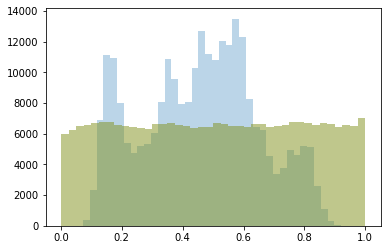

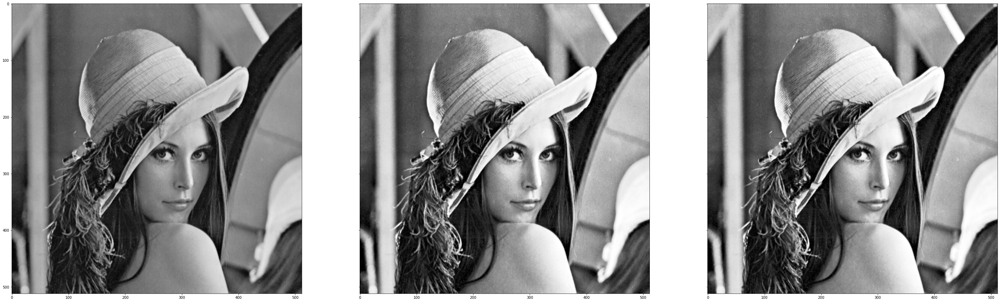

In [ ]:
original = img_pre
my_image = equalizeIntensity(img_pre)
alg_image = ski.exposure.equalize_hist(img_pre)


Utils.plot_test_compare(original, alg_image, my_image)

# Filtrado espacial: suavizado y realce

1. Implementar una función que permita realizar un filtrado espacial mediante 
convolución sobre una imagen con un kernel arbitrario que se le pasa como parametro. TODO -- Falla con tamaños pares de ancho de kernel
---

> outImage = **filterImage** (inImage, kernel)

> *   **inImage**: Matriz MxN con la imagen de entrada
> *   **outImage**: Matriz MxN con la imagen de salida.

> *   **kernel**: Matriz **PxQ** con el kernel del filtro de entrada. Se asume que la
posición central del filtro está en **([P/2] + 1, [Q/2] + 1)**.

---

In [ ]:
def filterImage(inImage, kernel):
  copiaI = np.copy(inImage)

  if len(kernel.shape) == 1 :
    kernel = np.array([kernel]).T

  (imgX, imgY) = copiaI.shape
  (kerX, kerY) = kernel.shape
  (xK, yK) = (math.floor(kerX/2), math.floor(kerY/2))

  initI = lambda n, nK: (n - nK) if n > nK else 0; 
  finI = lambda n, nK, fin: (n + nK + 1) if (n + nK + 1) <= fin else fin;
  
  initK = lambda n, nK: (nK - n) if n < nK else 0;
  finK = lambda n, nK, fin: (2 * nK + 1 ) - ((n + nK + 1) - fin) if (n + nK + 1) > fin else 2 * nK + 1; 

  for x in np.arange(xK, imgX):
    for y in np.arange(y, imgY):
      copyImage = inImage[initI(x,xK):finI(x,xK,imgX), initI(y,yK):finI(y,yK,imgY)]
      copyKernel = kernel[initK(x,xK):finK(x,xK,imgX), initK(y,yK):finK(y,yK,imgY)]
      # print("Iter(",x,",",y,")");
      # print("Image(",initI(x,xK),":", finI(x,xK,imgX),",", initI(y,yK),":", finI(y,yK,imgY),") -> ",copyImage.shape);
      # print("Kernel(",initK(x,xK),":", finK(x,xK,imgX),",", initK(y,yK),":", finK(y,yK,imgY),") -> ",copyKernel.shape);
      # print("\n")
      copiaI[x,y] = (copyKernel*copyImage).sum()

  return copiaI;           

In [ ]:
def filterImage(inImage, kernel):
  copiaI = np.copy(inImage)
  
  try: (kerX, kerY) = kernel.shape
  except:
    try:
      kernel = np.array([kernel])
      (kerX, kerY) = kernel.shape
    except:
        raise Exception("Kernel shape error ",kernel.shape)
    
  (imgX, imgY) = copiaI.shape

  if (kerX % 2==0) or (kerY % 2 == 0)  : 
    raise Exception("Kernel shape error ",kernel.shape)
  else :
    (xk, yk) = (math.floor(kerX/2), math.floor(kerY/2))

  for x in range(xk, imgX-xk):
    for y in range(yk, imgY-yk):
      copiaI[x,y] = (kernel*inImage[x-xk:x+xk+1, y-yk:y+yk+1]).sum()
      # copiaI[x,y] = convolve2d(kernel,inImage[x-xk:x+xk+1, y-yk:y+yk+1],mode='valid')
      
  return copiaI


CPU times: user 1.06 s, sys: 1.61 ms, total: 1.06 s
Wall time: 1.06 s
CPU times: user 8.77 ms, sys: 0 ns, total: 8.77 ms
Wall time: 8.26 ms


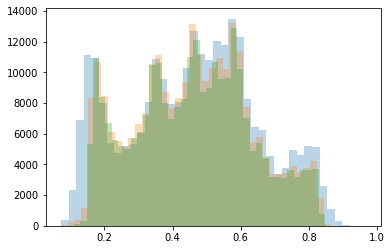

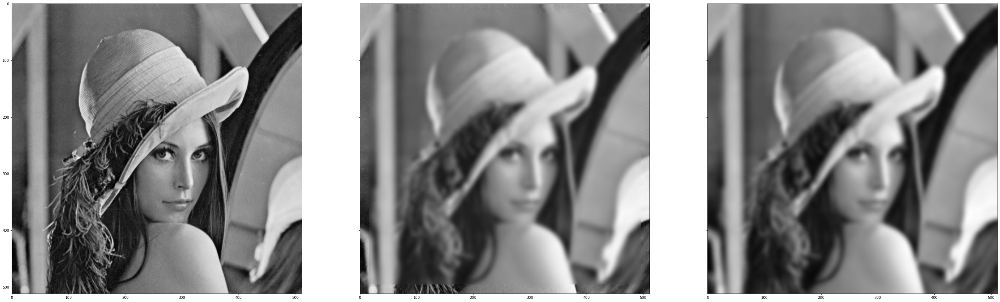

In [ ]:
original = img_pre
%time result = my_filtered = filterImage(img_pre, Gaussian2DKernel(4).array)
%time result = alg_filtered = gaussian_filter(img_pre, sigma=4)
Utils.plot_test_compare(original, my_filtered, alg_filtered)

2. Implementar una función que calcule un **kernel Gaussiano unidimensional** con σ dado.
---

> outImage = **gaussKernel1D** (sigma)

> *   **sigma**: Parámetro σ de entrada.
> *   **kernel**: Vector 1xN con el kernel de salida, teniendo en cuenta que:
>> * El centro x = 0 de la Gaussiana está en la posición [N/2] + 1.
>> * N se calcula a partir de σ como N = 2[3σ] + 1.

---

In [ ]:
def gaussKernel1D(sigma):
  N = 2*3*sigma + 1
  mu = N/2 + 1
  x = np.arange(-int(N/2), int(N/2)+1, 1) 
  
  p2 = np.exp(-np.power(x, 2.) / (2 * np.power(sigma, 2.)))
  p1 = 1/(np.sqrt(2 * np.pi)*sigma)

  plt.plot(x,p1*p2)
  plt.show()

  return p1*p2;

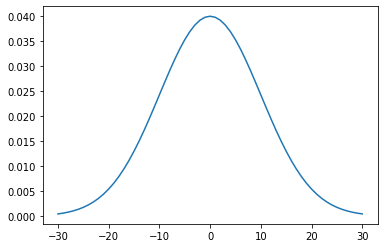

CPU times: user 741 ms, sys: 7.23 ms, total: 748 ms
Wall time: 747 ms
CPU times: user 643 ms, sys: 0 ns, total: 643 ms
Wall time: 642 ms


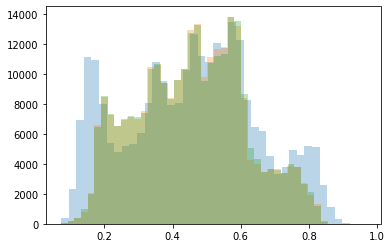

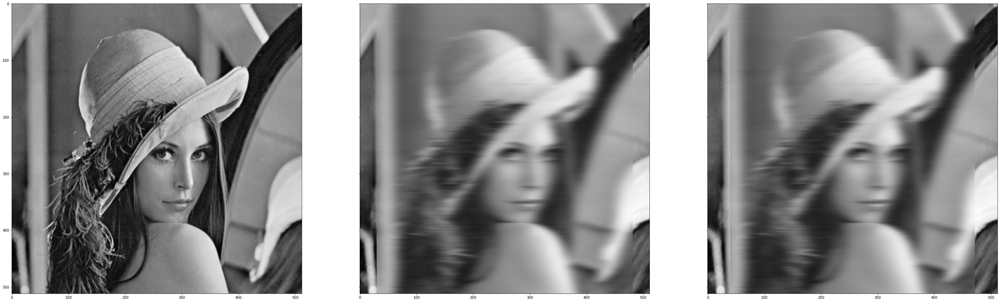

In [ ]:
original = img_pre
%time result = my_filtered = filterImage(img_pre, gaussKernel1D(10))
%time result = alg_filtered = filterImage(img_pre, Gaussian1DKernel(10).array)
Utils.plot_test_compare(original, my_filtered, alg_filtered)

3. Implementar una función que permita realizar un **suavizado Gaussiano bidimensional** usando un filtro N × N de parámetro σ, donde N se calcula igual que en la función anterior.
---

> outImage = **gaussianFilter** (inImage, sigma)

> *   **inImage, outImage, sigma: ...**: ...
> *   Nota. Como el filtro Gaussiano es lineal y separable podemos implementar
este suavizado simplemente convolucionando la imagen, primero, con un kernel Gaussiano unidimensional 1×N y, luego, convolucionando el resultado con el kernel transpuesto N × 1.

---

In [ ]:
def gaussianFilter(inImage, sigma):
  kt = np.array([gaussKernel1D(sigma)])
  k = kt.T
  return filterImage(filterImage(inImage, k), kt)


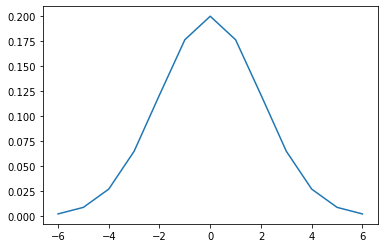

CPU times: user 1.65 s, sys: 3.04 ms, total: 1.65 s
Wall time: 1.65 s
CPU times: user 911 ms, sys: 0 ns, total: 911 ms
Wall time: 910 ms


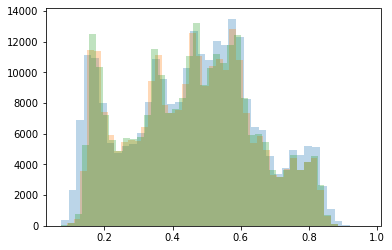

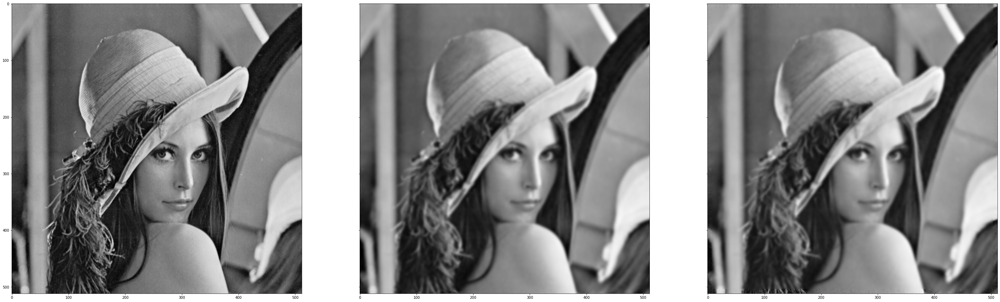

In [ ]:
original = img_pre
%time result = my_filtered = gaussianFilter(img_pre, 2)
%time result = alg_filtered = filterImage(img_pre, Gaussian2DKernel(2).array)

Utils.plot_test_compare(original, my_filtered, alg_filtered)

3. Implementar una función que permita realizar un **filtro de medianas bidimensional** especificando el tamaño del filtro
---

> outImage = **medianFilter** (inImage, filterSize)

> *   **inImage, outImage, sigma: ...**: ...
> *   Valor entero N indicando que el tamaño de ventana es de NxN.
La posición central de la ventana es [N/2] + 1, [N/2] + 1).

---

In [ ]:
def medianFilter(inImage, filterSize):

  if (filterSize % 2 == 0)  : 
    raise Exception("filterSize shape error ",filterSize)
    
  fx = math.floor(filterSize/2)
  fy = fx

  copiaI = np.copy(inImage)
  (imgX, imgY) = copiaI.shape

  for x in range(fx, imgX-fx):
    for y in range(fy, imgY-fy):
      copiaI[x,y] = np.median(inImage[x-fx:x+fx+1, y-fy:y+fy+1])

  return copiaI

CPU times: user 6.22 s, sys: 0 ns, total: 6.22 s
Wall time: 6.22 s
CPU times: user 563 ms, sys: 0 ns, total: 563 ms
Wall time: 560 ms


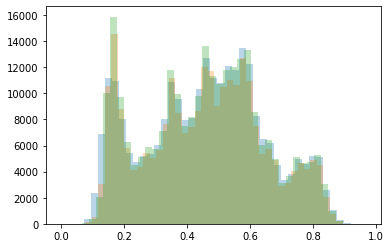

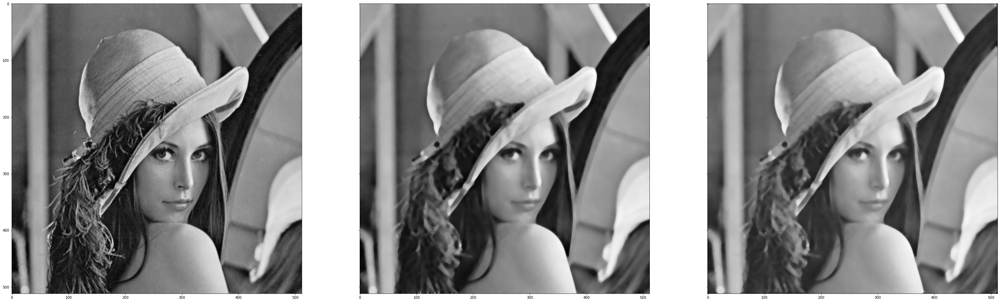

In [ ]:
original = img_pre
%time result = my_filtered = medianFilter(img_pre, 7)
%time result = alg_filtered = medfilt(img_pre, 7)

Utils.plot_test_compare(original, my_filtered, alg_filtered)

3. Implementar una función que permita realizar un **filtro de realce High Boost** que permita especificar, además del factor de
amplificación A, el método de suavizado utilizado y su parámetro.
---

> outImage = **highBoost** (inImage, A, method, param)

> *   **inImage, outImage, sigma: ...**: ...
> *   **A**: Factor de amplificación del filtro high-boost.
> *   **method** Método de suavizado. 
>>*   **'gaussian'**:  indicando que usará la función **gaussianFilter**
>>*   **'median'** indicando que usará la función **medianFIlter**
> *   **param** Valor del parámetro del filtro de suavizado. Proporcionará el valor
de σ en el caso del filtro Gaussiano, y el tamaño de ventana en el caso
del filtro de medianas.

---

In [ ]:
def highBoost(inImage, A, method, param):
  copiaI = np.copy(inImage)

  hb_method_types = ['gaussian', 'median']
  hb_mehtod = {
      hb_method_types[0] : lambda i, p: gaussianFilter(i, p),
      hb_method_types[1] : lambda i, p: medianFilter(i, p)
  }

  if method not in hb_method_types:
    raise Exception("not valid Method")
  
  f_smooth = hb_mehtod.get(method)(copiaI, param)
  sustracted = (A*copiaI - f_smooth)
  
  return sustracted


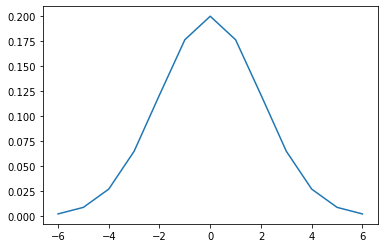

CPU times: user 1.65 s, sys: 0 ns, total: 1.65 s
Wall time: 1.65 s


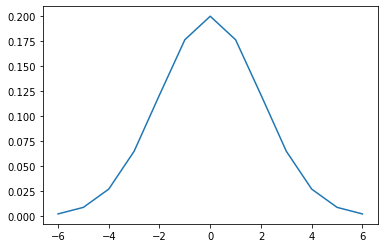

CPU times: user 1.54 s, sys: 3.67 ms, total: 1.55 s
Wall time: 1.54 s


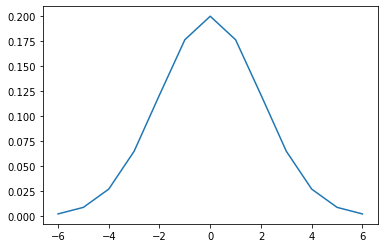

CPU times: user 1.64 s, sys: 0 ns, total: 1.64 s
Wall time: 1.64 s
CPU times: user 6.16 s, sys: 2.82 ms, total: 6.16 s
Wall time: 6.16 s
CPU times: user 6.19 s, sys: 0 ns, total: 6.19 s
Wall time: 6.19 s
CPU times: user 6.16 s, sys: 0 ns, total: 6.16 s
Wall time: 6.16 s


In [ ]:
original = img_pre
%time _ = my_gauss_1 = highBoost(img_pre, 1, 'gaussian', 2)
%time _ = my_gauss_2 = highBoost(img_pre, 2, 'gaussian', 2)
%time _ = my_gauss_3 = highBoost(img_pre, 3, 'gaussian', 2)

my_gauss_comp_1 = adjustIntensity(my_gauss_1, inRange = [0.0, 1.0])
my_gauss_comp_2 = adjustIntensity(my_gauss_2, inRange = [0.0, 1.0])
my_gauss_comp_3 = adjustIntensity(my_gauss_3, inRange = [0.0, 1.0])

%time _ = my_median_1 = highBoost(img_pre, 1, 'median', 3)
%time _ = my_median_2 = highBoost(img_pre, 2, 'median', 3)
%time _ = my_median_3 = highBoost(img_pre, 3, 'median', 3)

my_median_comp_1 = adjustIntensity(my_median_1, inRange = [0.0, 1.0])
my_median_comp_2 = adjustIntensity(my_median_2, inRange = [0.0, 1.0])
my_median_comp_3 = adjustIntensity(my_median_3, inRange = [0.0, 1.0])


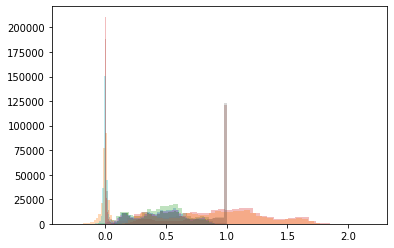

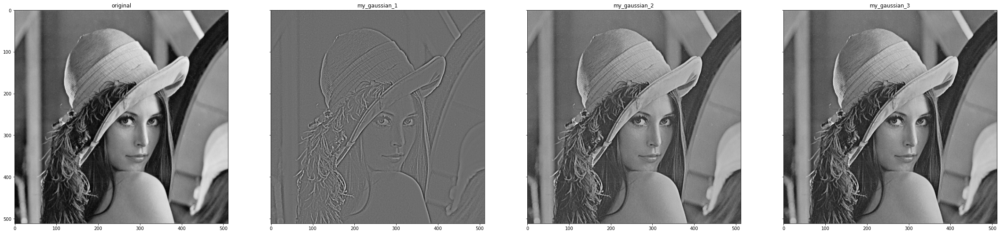

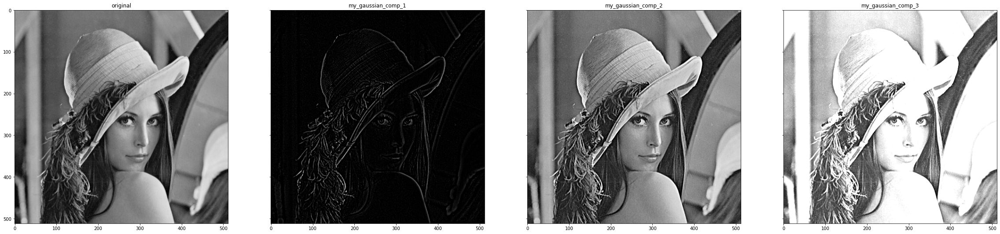

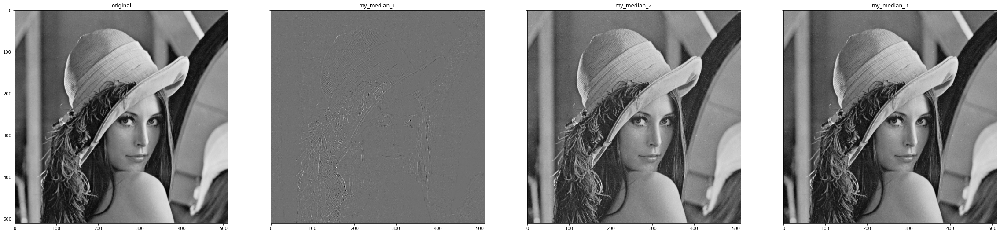

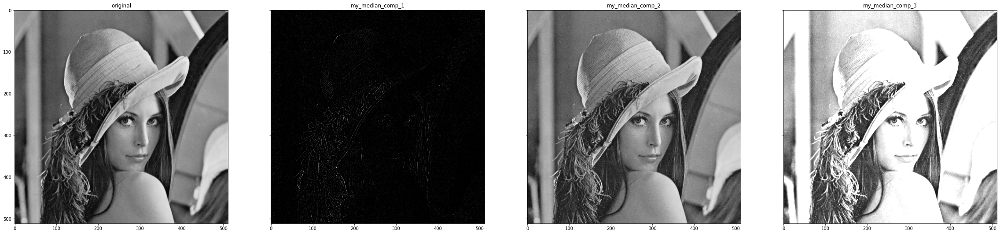

In [ ]:

imgs = [('original',original),('my_gaussian_1',my_gauss_1), ('my_gaussian_2',my_gauss_2), ('my_gaussian_3',my_gauss_3), 
        ('original',original),('my_gaussian_comp_1',my_gauss_comp_1), ('my_gaussian_comp_2',my_gauss_comp_2), ('my_gaussian_comp_3',my_gauss_comp_3), 
        ('original',original), ('my_median_1',my_median_1),('my_median_2',my_median_2),('my_median_3',my_median_3),
        ('original',original), ('my_median_comp_1',my_median_comp_1),('my_median_comp_2',my_median_comp_2),('my_median_comp_3',my_median_comp_3)]
Utils.plot_test_compare_n(imgs, 4)

3.3.**Operadores morfológicos**
---

> * Implementar los **operadores morfológicos de erosión, dilatación, apertura y cierre
para imágenes binarias** y elemento estructurante arbitrario

>> outImage = **erode** (inImage, SE, center=[])

>> outImage = **dilate** (inImage, SE, center=[])

>> outImage = **opening** (inImage, SE, center=[])

>> outImage = **closing** (inImage, SE, center=[])

>>> **inImage**, **outImage**: ...

>>> **SE**: Matriz **PxQ** de zeros y unos definiendo el elemento estructurante

>>> **center**: Vector 1x2 con las coordenadas del centro de SE. Se asume que el [0 0] es la esquina superior izquierda. Si es un vector vacío (valor por defecto), el centro se calcula como ([P/2]+1,[Q/2]+1)


---

In [ ]:
def erode(inImage, SE, center=[]):
  cpImage = np.copy(inImage)
  (ix, iy) = inImage.shape
  
  try:
    (p,q) = SE.shape
  except:
    try:
      (p,) = SE.shape
      q = 1
    except:
      raise Exception("Error wrong SE shape ",SE.shape)

  if not center:
    (cx, cy) = (int(p/2+1), int(q/2+1))
  else:
    (cx, cy) = (center[0], center[1])

  (initX, finX) = (-cx, p-cx)
  (initY, finY) = (-cy, q-cy) 

  for i in range(cx, ix-finX+1):
    for j in range(cy, iy-finY+1):
      if inImage[i,j]==0.0 :
        mesh = inImage[i+initX:i+finX,j+initY:j+finY]
        cpImage[i+initX:i+finX,j+initY:j+finY] = np.minimum((1.0-SE),cpImage[i+initX:i+finX,j+initY:j+finY])
  return cpImage


(20, 20)


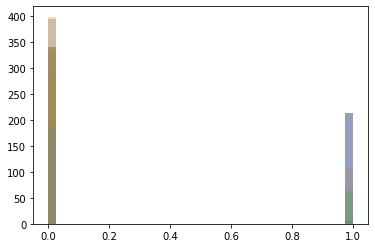

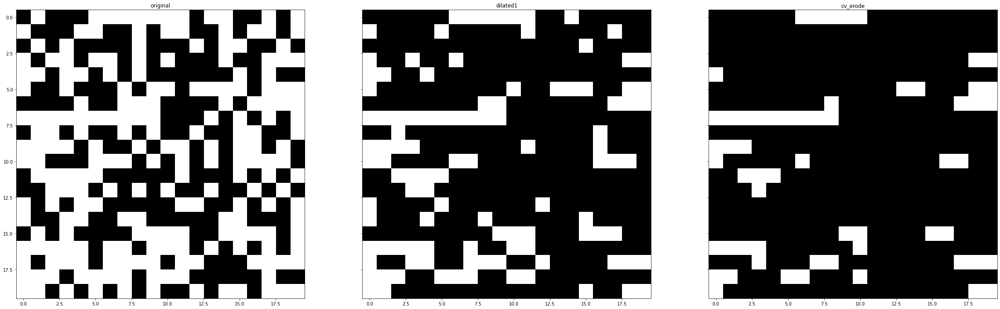

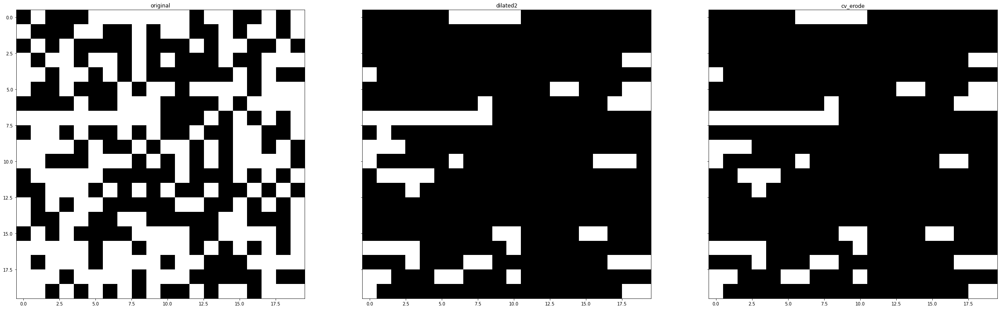

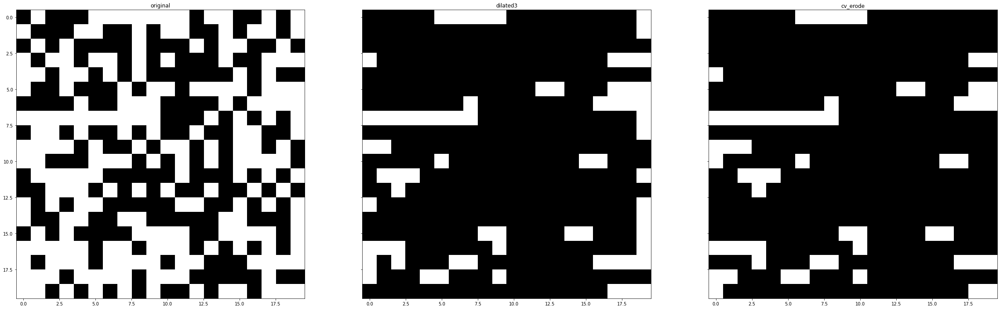

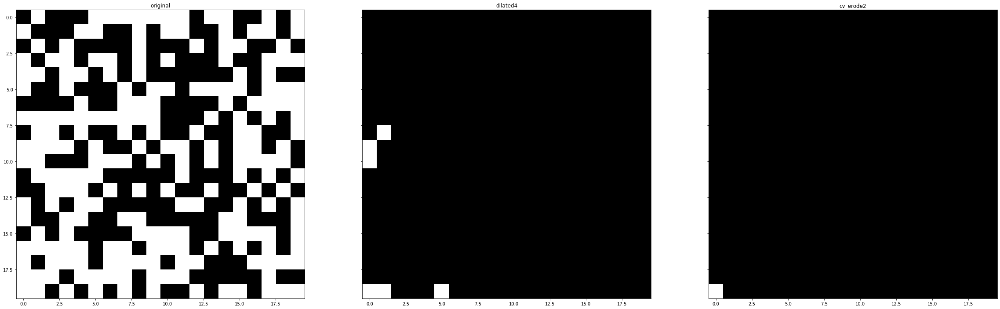

In [ ]:
  
img_pre = np.random.randint(2, size=(20,20))
binarr = np.where(img_pre>0.2, 1.0, 0)
print(binarr.shape)
erode1 = erode(binarr,np.array([[1.,1.]]),[0,0])
erode2 = erode(binarr,np.array([[1., 1., 1.]]),[0,1])
erode3 = erode(binarr,np.array([[1., 1., 1.]]),[0,2])
erode4 = erode(binarr,np.array([[1., 1., 1.], [1., 1., 1.], [1., 1., 1.]]),[1,1])

cv_erode = cv2.erode(binarr,np.array([[1., 1., 1.]]))
cv_erode2 = cv2.erode(binarr, np.array([[1., 1., 1.], [1., 1., 1.], [1., 1., 1.]]))

imgs=[('original', binarr),
      ('dilated1',erode1),
      ('cv_erode',cv_erode),
      ('original', binarr),
      ('dilated2',erode2),
      ('cv_erode',cv_erode),
      ('original', binarr),
      ('dilated3',erode3),
      ('cv_erode',cv_erode),
      ('original', binarr),
      ('dilated4',erode4),
      ('cv_erode2',cv_erode2)
      ]
Utils.plot_test_compare_n(imgs,3)

In [ ]:
def dilate(inImage, SE, center=[]):
  cpImage = np.copy(inImage)
  (ix, iy) = inImage.shape
  
  try:
    (p,q) = SE.shape
  except:
    try:
      (p,) = SE.shape
      q = 1
    except:
      raise Exception("Error wrong SE shape ",SE.shape)

  if not center:
    (cx, cy) = (int(p/2+1), int(q/2+1))
  else:
    (cx, cy) = (center[0], center[1])

  (initX, finX) = (-cx, p-cx)
  (initY, finY) = (-cy, q-cy) 

  for i in range(cx, ix-finX+1):
    for j in range(cy, iy-finY+1):
      if inImage[i,j]==1.0 :
        mesh = inImage[i+initX:i+finX,j+initY:j+finY]
        cpImage[i+initX:i+finX,j+initY:j+finY] = np.maximum(SE,cpImage[i+initX:i+finX,j+initY:j+finY])
        
  return cpImage


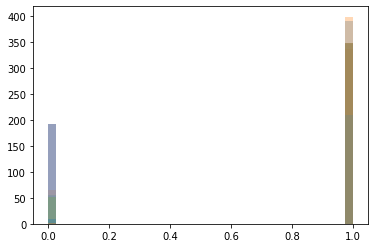

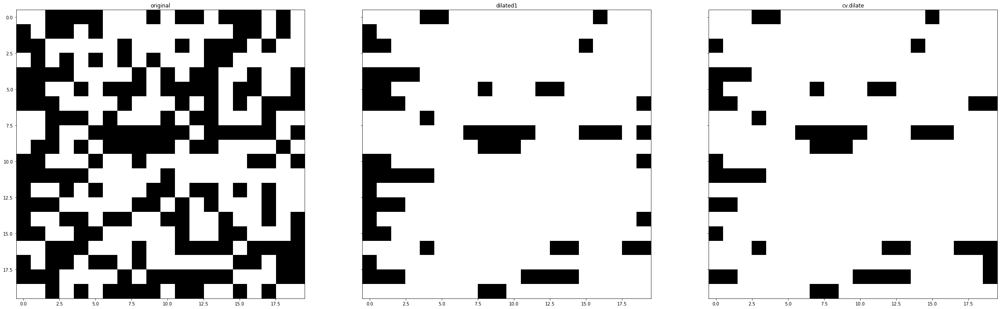

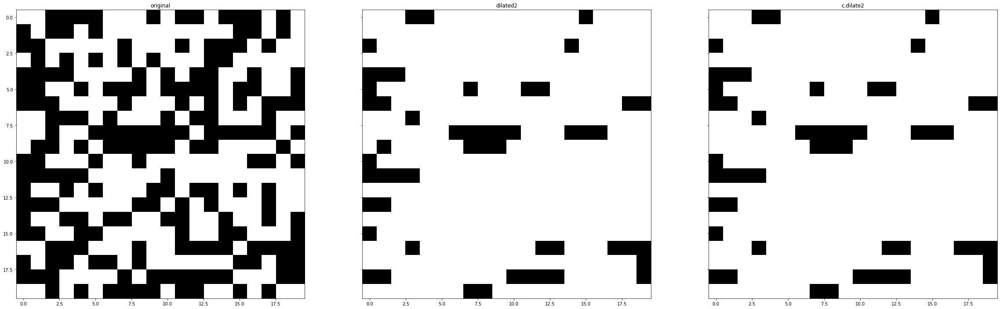

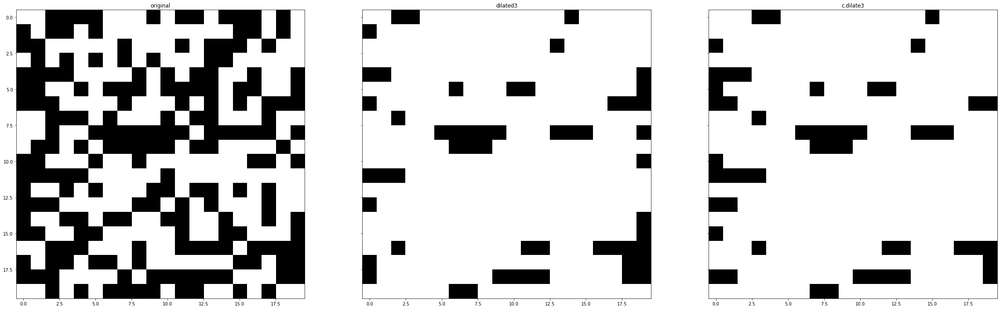

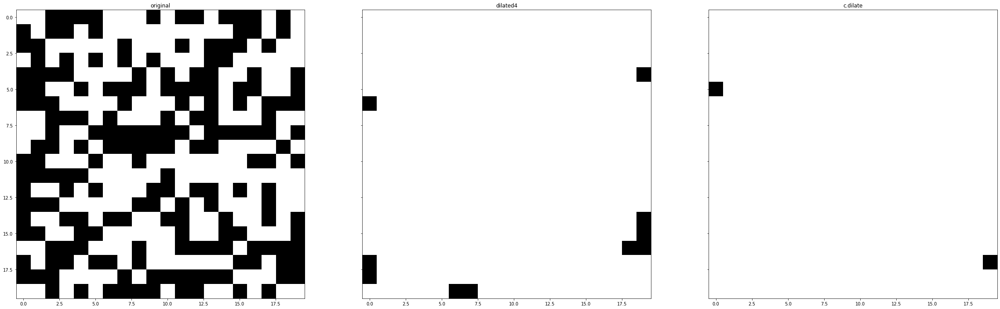

In [ ]:
img_pre = np.random.randint(2, size=(20,20))
binarr = np.where(img_pre>0.2, 1.0, 0)

dilated1 = dilate(binarr,np.array([[1., 1., 1.]]),[0,0])
dilated2 = dilate(binarr,np.array([[1., 1., 1.]]),[0,1])
dilated3 = dilate(binarr,np.array([[1., 1., 1.]]),[0,2])
dilated4 = dilate(binarr,np.array([[1., 1., 1.], [1., 1., 1.], [1., 1., 1.]]))
cv_dilate = cv2.dilate(binarr,np.array([[1., 1., 1.]]))
cv_dilate2 = cv2.dilate(binarr, np.array([[1., 1., 1.], [1., 1., 1.], [1., 1., 1.]]))

imgs=[('original', binarr),
      ('dilated1', dilated1),
      ('cv.dilate', cv_dilate),
      ('original', binarr),
      ('dilated2', dilated2),
      ('c.dilate2',cv_dilate),
      ('original', binarr),
      ('dilated3', dilated3),
      ('c.dilate3',cv_dilate),
      ('original', binarr),
      ('dilated4', dilated4),
      ('c.dilate', cv_dilate2)
      ]
Utils.plot_test_compare_n(imgs,3)

In [ ]:
def opening (inImage, SE, center=[]):
  return dilate(erode(inImage, SE, center),SE, center)


In [ ]:
def closing (inImage, SE, center=[]):
  return erode(dilate(inImage, SE, center),SE, center)

*   Implementar el algoritmo de llenado morfológico de regiones de una imagen, dado un
elemento estructurante de conectivdad, y una lista de puntos semilla

> * outImage = **fill** (inImage, seeds, SE=[], center=[])

>> **inImage**: ...

>> **seeds**: Matriz Nx2 con N coordenadas (fila,columna) de los puntos semilla.

>> **SE**: Matriz PxQ de zeros y unos definiendo el elemento estructurante de
conectividad. Si es un vector vac´ıo se asume conectividad 4 (cruz 3×3).

In [ ]:
def fill (inImage, seeds, SE=[], center=[]):
  A = inImage
  end = False

  if not SE:SE = np.array([[0.0,1.0,0.0],[1.0,1.0,1.0],[0.0,1.0,0.0]])
  if not center:center = [1,1]
  
  for p in seeds :
    A_c = 1.0 - A
    X = np.zeros(inImage.shape)
    X[p] = 1.0
    while not end:
      X_p = np.minimum(dilate(X,SE,center), A_c)
      if (X_p == X).all(): end = True
      X = X_p
    A = np.maximum(X_p, A)
    end = False
  
  return A
    


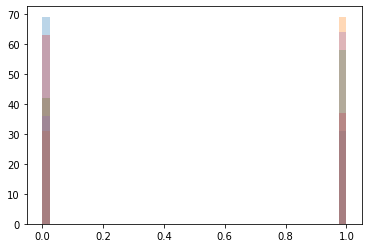

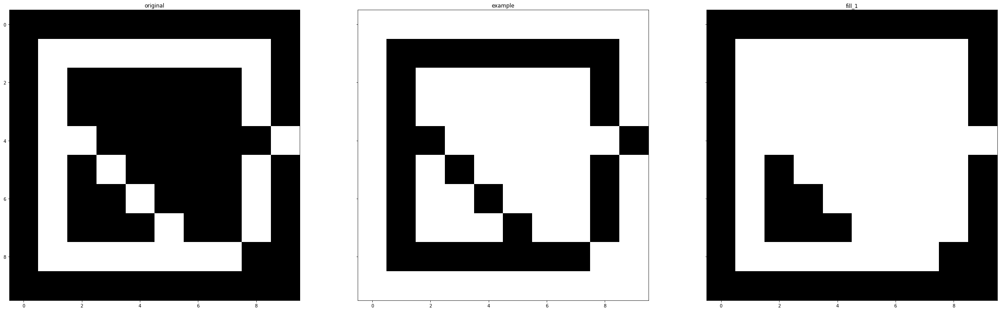

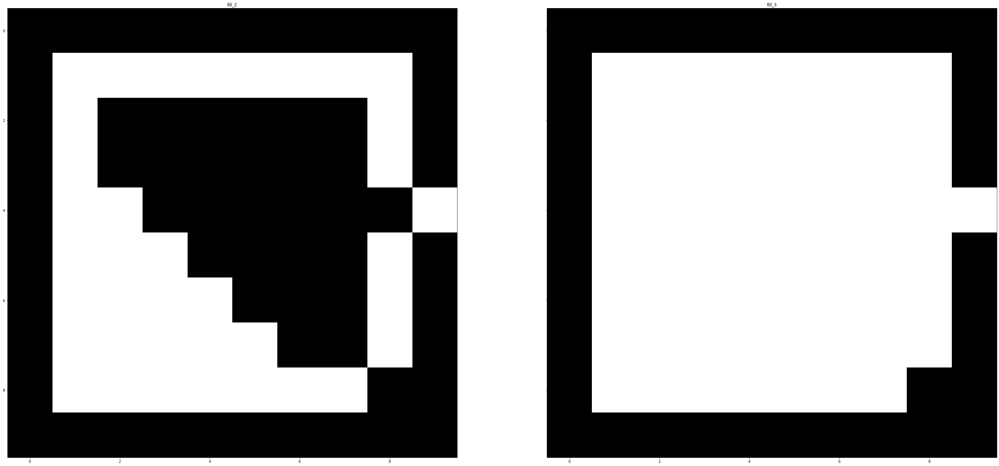

In [ ]:
arr = np.array([[0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0],
          [0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0],
          [0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0],
          [0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0],
          [0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0],
          [0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0],
          [0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0],
          [0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0],
          [0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0],
          [0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0]])

alg_c = 1.0 - arr ; 
fill_alg1 = fill(arr,[(4,6)])
fill_alg2 = fill(arr,[(7,3)])
fill_alg3 = fill(arr,[(4,6), (7,3)]) 
imgs = [('original', arr), ('example', alg_c), ('fill_1', fill_alg1), ('fill_2', fill_alg2), ('fill_3', fill_alg3)]
Utils.plot_test_compare_n(imgs,3)

*   Implementar una función que permita obtener las componentes Gx y Gy del **gradiente de una imagen**, pudiendo elegir entre los operadores de **Roberts**, **CentralDiff** (Diferencias centrales de Prewitt/Sobel sin promedio: i.e. [−1, 0, 1] y transpuesto), **Prewitt** y **Sobel**.

> [Gx, Gy] = **gradientImage** (inImage, operator)

>> **inImage**: ...

>> **gx, gy**: Componentes Gx y Gy del gradiente.

>> **operator**: Permite seleccionar el operador utilizado mediante los valores: **’Roberts’**, **’CentralDiff’**, **’Prewitt’** o **’Sobel’**.

In [ ]:
def conV1(inImage, kernel, centers=()):
  copiaI = np.copy(inImage)
  
  try: (kerX, kerY) = kernel.shape
  except:
    try:
      kernel = np.array([kernel])
      (kerX, kerY) = kernel.shape
    except:
        raise Exception("Kernel shape error ",kernel.shape)
    
  (imgX, imgY) = copiaI.shape
  inpar = 0

  if centers:
    (xk, yk) = centers
  else :
    if (kerX % 2==0) or (kerY % 2 == 0)  : 
      (xk, yk) = (math.floor(kerX/2)-1, math.floor(kerY/2)-1)
    else :
      (xk, yk) = (math.floor(kerX/2), math.floor(kerY/2))
      inpar = 1

  for x in range(xk, imgX-xk):
    for y in range(yk, imgY-yk):
      # copiaI[x,y] = np.maximum(0.0,(kernel*inImage[x-xk:x+xk+inpar, y-yk:y+yk+inpar]).sum())
      copiaI[x,y] = (kernel*inImage[x-xk:x+xk+inpar, y-yk:y+yk+inpar]).sum()
  # copiaI = np.where(copiaI<0.0, -copiaI, copiaI)
  return copiaI

In [ ]:
def gradientImage(inImage, operador):
  op_types = ['Roberts', 'CentralDiff','Prewitt','Sobel']
  op_masks = {
      op_types[0] : (np.array([[-1,0],[0,1]]),np.array([[-1,0],[0,1]]).T,(1,1)),
      op_types[1] : (np.array([-1,0,1]),np.array([[-1,0,1]]).T, ()), ## Se divide entre 2?
      op_types[2] : (np.array([[-1,0,1],[-1,0,1],[-1,0,1]]), np.array([[-1,0,1],[-1,0,1],[-1,0,1]]).T, ()),
      op_types[3] : (np.array([[-1,0,1],[-2,0,2],[-1,0,1]]), np.array([[-1,0,1],[-2,0,2],[-1,0,1]]).T, ()) ##Según teoría se puede optimizar separando la matrix
  }

  if operador not in op_types:
    raise Exception("Wrong op, ",operador, " not in ", op_types)
  
  (maskX, maskY, centers) = op_masks.get(operador)

  auX = conV1(inImage, maskX, centers)
  auY = conV1(inImage, maskY, centers)

  Gx = adjustIntensity(auX, [0.0, 1.0])
  Gy = adjustIntensity(auY, [0.0, 1.0])
  
  return [Gx, Gy]

In [ ]:
img_pre = image_gray(url+"/lena.png")
original = img_pre
%time _ = [my_robert_x, my_robert_y] = gradientImage(original, 'Roberts')
%time _ = [my_cd_x, my_cd_y] = gradientImage(original, 'CentralDiff')
%time _ = [my_prewitt_x, my_prewitt_y] = gradientImage(original, 'Prewitt')
%time _ = [my_sobel_x, my_sobel_y] = gradientImage(original, 'Sobel')

CPU times: user 1.76 s, sys: 0 ns, total: 1.76 s
Wall time: 1.76 s
CPU times: user 1.73 s, sys: 3.44 ms, total: 1.73 s
Wall time: 1.73 s
CPU times: user 1.78 s, sys: 0 ns, total: 1.78 s
Wall time: 1.78 s
CPU times: user 1.79 s, sys: 0 ns, total: 1.79 s
Wall time: 1.79 s


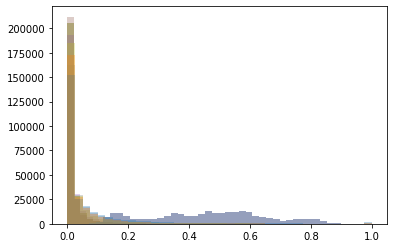

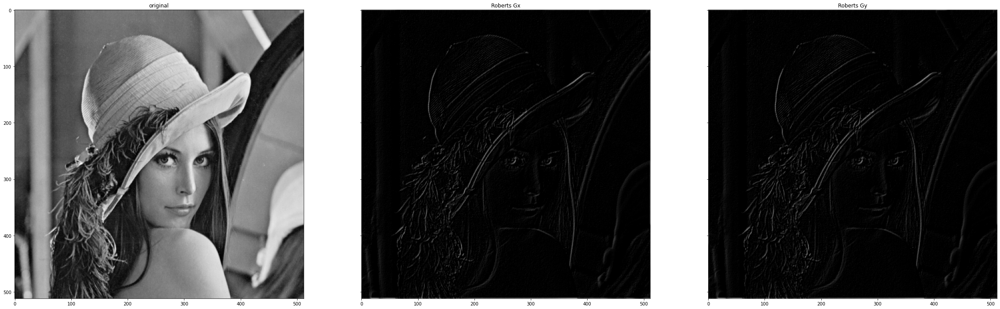

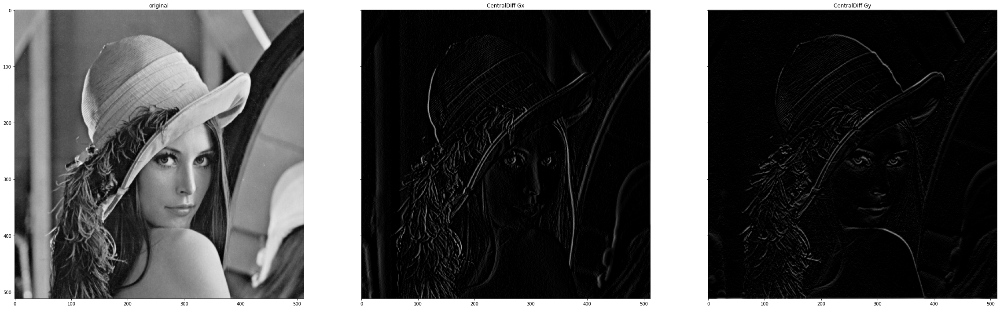

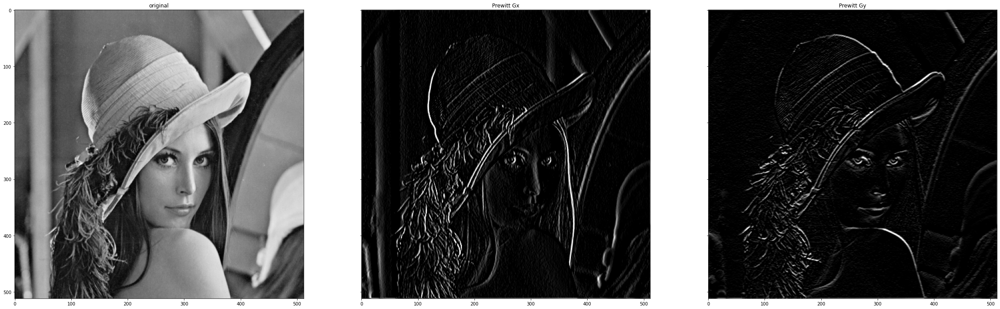

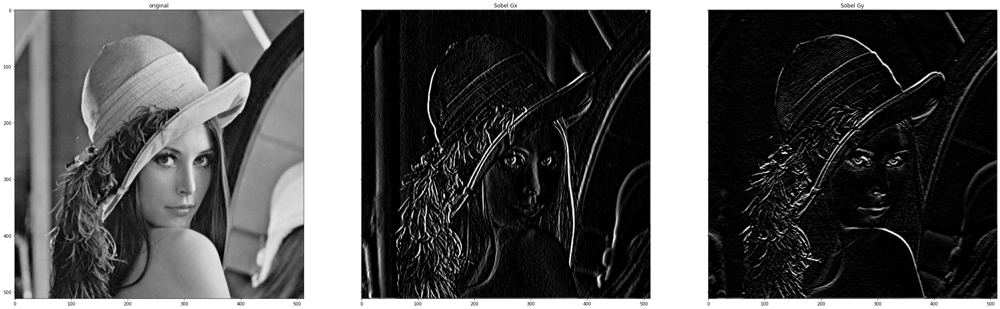

In [ ]:
imgs = [
        ('original',original), ("Roberts Gx", my_robert_x), ("Roberts Gy", my_robert_y),
        ('original',original), ("CentralDiff Gx", my_cd_x), ("CentralDiff Gy", my_cd_y),
        ('original',original), ("Prewitt Gx", my_prewitt_x), ("Prewitt Gy", my_prewitt_y),
        ('original',original), ("Sobel Gx", my_sobel_x), ("Sobel Gy", my_sobel_y),
        ]
Utils.plot_test_compare_n(imgs, 3)

* Implementar el detector de bordes de Canny.
>* outImage = **edgeCanny** (inImage, sigma, tlow, thigh)
>> * **inImage**, **outImage**: ...
>> * **sigma**: Parámetro σ del filtro Gaussiano. tlow, thigh: Umbrales de histéresis bajo y alto, respectivamente.